# サンプルが正規分布に従う場合

In [1]:
from bayesian_ab import stats

tanka = stats.LogNormal(5000, 0.3)
tanka.get_fig(0, 15000, title=f'真の単価の分布(対数正規分布)[mean={tanka.mean:.0f},std={tanka.std:.0f}]').show()

In [2]:
import numpy as np
N = 5000
samples = tanka.rvs(N)  # 反響した人500人の単価を調査
log_samples = np.log(samples)  # 対数を取ったものは正規分布に従う

# ハイパーパラメータの初期化(事前分布を定義)
m, lam, alpha, beta = 0, 1, 1, 1

# 事後分布パラメータ更新
params = []
for x in log_samples:
    lam_ = lam + 1
    m_ = 1 / lam_ * (x + lam * m)
    alpha = 0.5 + alpha
    beta = 0.5 * (x ** 2 + lam * (m ** 2) - lam_ * (m_ ** 2)) + beta
    m, lam = m_, lam_
    params.append((m, lam, alpha, beta))

params[-1]

(8.511108291115729, 5001, 2501.0, 258.42256362850014)

In [3]:
from bayesian_ab.plots import gen_posterior_animation

idxs = [*range(0, 100, 10)] + [*range(100, N, (N-100)//50)]
ps = [(i, *params[i]) for i in idxs]
dists = {i: stats.StudentT(2*a, m, b / a * lam) for i, m, lam, a, b in ps}

path = 'images/tanka_posterior.gif'
# gen_posterior_animation(path, dists, x_min=8, x_max=9)

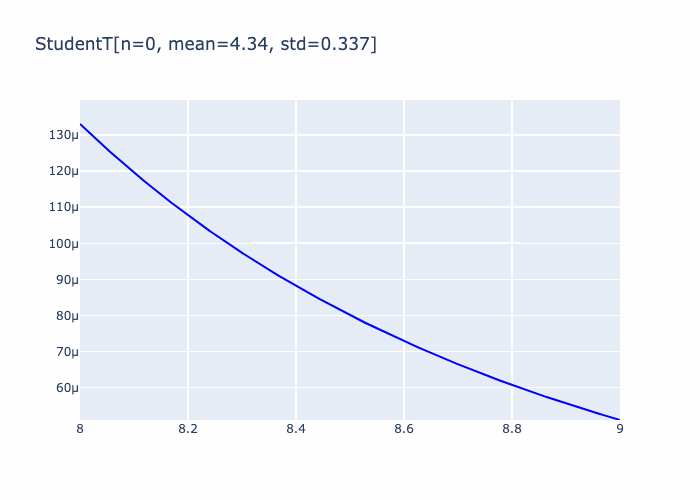

In [4]:
from IPython.display import Image

with open(path,'rb') as f:
    image = Image(data=f.read(), format='png')
image

## A/B

In [5]:
# 事後分布の一括更新式
def batch(xs, m=0, lam=1, alpha=1, beta=1):
    lam_ = lam + len(xs)
    m_ = 1 / lam_ * (sum(xs) + lam * m)
    alpha_ = len(xs) / 2 + alpha
    sum_x2 = sum(map(lambda x: x*x, xs))
    beta_ = 0.5 * (sum_x2 + lam * m ** 2 - lam_ * m_ ** 2) + beta
    return m_, lam_, alpha_, beta_

In [6]:
from bayesian_ab import stats

A = stats.LogNormal(5000, 0.3)
B = stats.LogNormal(5500, 0.35)
print(f'真のAの平均単価{A.mean:.0f}, 真のBの平均単価{B.mean:.0f}')

# A/B test samples 1000
N = 500
samplesA = A.rvs(N)
samplesB = B.rvs(N)

真のAの平均単価5230, 真のBの平均単価5847


In [7]:
import numpy as np
from bayesian_ab.plots import histogramAB

# 事後分布
pA, pB = batch(np.log(samplesA)), batch(np.log(samplesB))

posterior_x = lambda m, lam, a, b: stats.StudentT(2*a, m, b/a*lam)
postA, postB = posterior_x(*pA), posterior_x(*pB)
sN = int(5e5)
xA, xB = postA.rvs(sN), postB.rvs(sN)
z = np.exp(xB) - np.exp(xA)
zN, zP = z[z<=0], z[z>0]

histogramAB(zN, zP, -1000, 2000, 50)